In [1]:
import os
import glob
import copy
from collections import defaultdict
import random
from abc import ABC, abstractmethod
import importlib
import functools
import time
import random


import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.nn import init
from torch.optim import lr_scheduler
from torch.utils.data import Dataset,DataLoader
import cv2 as cv
import imagesize
import torchvision.transforms as T
from PIL import Image
from joblib import Parallel, delayed
from tqdm.auto import tqdm

import utils
from dataset import TrashDataset

from vae_v2 import init_net, init_weights
from vae_v2.aae import AAE
from vae_v2.cae import CAE
from vae_v2.dataset import TrashDataset
from vae_v2.data import CustomDatasetDataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2



In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
class Opt:
    data_dir: str = "../student_db"
    channels:int = 3
    img_size: int = 256
    gpu: list[int] = [0]
    model: str = "cae"
    save_dir: str = "vae_v2_saved_models/aae"
    latent: int = 100
    init_type: str = "normal" # [normal | xavier | kaiming | orthogonal]
    init_gain: float = 0.02
    cropsize: int = 256
    verbose:bool=False

    # train options
    print_epoch_freq: int = 1
    save_epoch_freq: int = 20
    epoch_count: int = 0
    n_epochs: int = 180
    n_epochs_decay: int = 61
    beta1: float = 0.5
    beta2: float = 0.999
    lr: float = 0.00002
    lr_policy: str = "linear" # [linear | step | plateau | cosine]
    lr_decay_iters: int = 50
    batch_size: int = 256
    mode: str = "train"
    num_threads:int = 10
    no_dropout: bool = True
    rotate: bool = True
    brightness:float=  0.1
    object:str = "notrash"

    means = (0.5, 0.5, 0.5) # (0.485, 0.456, 0.406)
    stds = (0.5, 0.5, 0.5)  # (0.229, 0.224, 0.225)

opt = Opt()

In [4]:
def get_transform(opt):
    """Transforms images"""
    transform = []
    if opt.rotate == True:
        transform.append(T.RandomRotation(0.5))
    transform.append(T.ColorJitter(brightness=opt.brightness))
    transform.append(T.Resize((opt.cropsize, opt.cropsize), interpolation=2))
    transform.append(T.ToTensor())
    if opt.channels == 3:
        transform.append(T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)))
    elif opt.channels == 1:
        transform.append(T.Normalize((0.5), (0.5)))

    return T.Compose(transform)

In [5]:
def get_test_transform(opt):
    """Transforms images"""
    transform = []

    transform.append(T.Resize((opt.cropsize, opt.cropsize), interpolation=2))
    transform.append(T.ToTensor())
    if opt.channels == 3:
        transform.append(T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)))
    elif opt.channels == 1:
        transform.append(T.Normalize((0.5), (0.5)))

    return T.Compose(transform)

In [6]:
%reload_ext autoreload

dataset = TrashDataset("../student_db", transform=get_transform(opt), train=True, grayscale=False, subset=True)
dataset_size = len(dataset)
# data_loader = CustomDatasetDataLoader(opt, dataset)
# dataset = data_loader.load_data()
print(f"Training size is = {dataset_size}")

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 416 tasks      | elapsed:    0.5s
[Parallel(n_jobs=8)]: Done 1816 tasks      | elapsed:    1.1s
[Parallel(n_jobs=8)]: Done 3216 tasks      | elapsed:    1.3s
[Parallel(n_jobs=8)]: Done 5016 tasks      | elapsed:    2.1s
[Parallel(n_jobs=8)]: Done 6816 tasks      | elapsed:    2.6s
[Parallel(n_jobs=8)]: Done 9016 tasks      | elapsed:    3.4s
[Parallel(n_jobs=8)]: Done 11216 tasks      | elapsed:    4.1s
[Parallel(n_jobs=8)]: Done 13237 tasks      | elapsed:    4.7s
[Parallel(n_jobs=8)]: Done 13521 tasks      | elapsed:    4.9s


Training size is = 15000


[Parallel(n_jobs=8)]: Done 13626 tasks      | elapsed:    5.0s
[Parallel(n_jobs=8)]: Done 14310 tasks      | elapsed:    5.0s
[Parallel(n_jobs=8)]: Done 14429 tasks      | elapsed:    5.1s
[Parallel(n_jobs=8)]: Done 14934 tasks      | elapsed:    5.1s
[Parallel(n_jobs=8)]: Done 15000 out of 15000 | elapsed:    5.2s finished


initialize network with normal
initialize network with normal
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
-----------------------------------------------
0 : learning rate 0.0000200 -> 0.0000200


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:139: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


epoch : 0 | total_iters : 58 | epoch_time:8.151 | loss:16.119428634643555
saving the latest model (epoch 0, total_iters 58)
encoder saved in:  vae_v2_saved_models/aae/notrash/cae_e_0.pth
decoder saved in:  vae_v2_saved_models/aae/notrash/cae_d_0.pth


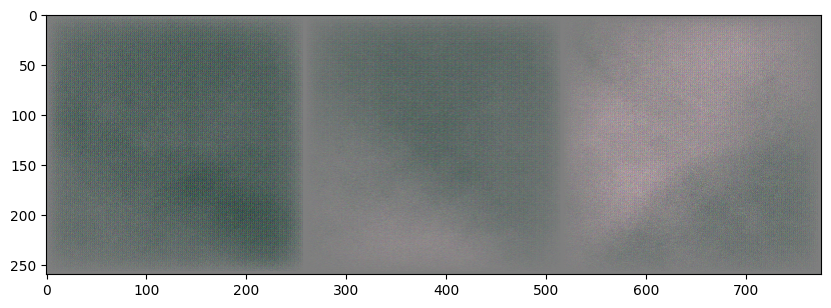

1 : learning rate 0.0000200 -> 0.0000200
epoch : 1 | total_iters : 116 | epoch_time:7.924 | loss:13.437713623046875
2 : learning rate 0.0000200 -> 0.0000200
epoch : 2 | total_iters : 174 | epoch_time:7.934 | loss:11.238554000854492
3 : learning rate 0.0000200 -> 0.0000200
epoch : 3 | total_iters : 232 | epoch_time:7.866 | loss:11.020217895507812
4 : learning rate 0.0000200 -> 0.0000200
epoch : 4 | total_iters : 290 | epoch_time:7.953 | loss:9.50521183013916
5 : learning rate 0.0000200 -> 0.0000200
epoch : 5 | total_iters : 348 | epoch_time:9.276 | loss:9.346586227416992
6 : learning rate 0.0000200 -> 0.0000200
epoch : 6 | total_iters : 406 | epoch_time:7.929 | loss:7.686685562133789
7 : learning rate 0.0000200 -> 0.0000200
epoch : 7 | total_iters : 464 | epoch_time:8.043 | loss:8.369690895080566
8 : learning rate 0.0000200 -> 0.0000200
epoch : 8 | total_iters : 522 | epoch_time:7.977 | loss:8.032134056091309
9 : learning rate 0.0000200 -> 0.0000200
epoch : 9 | total_iters : 580 | epoch

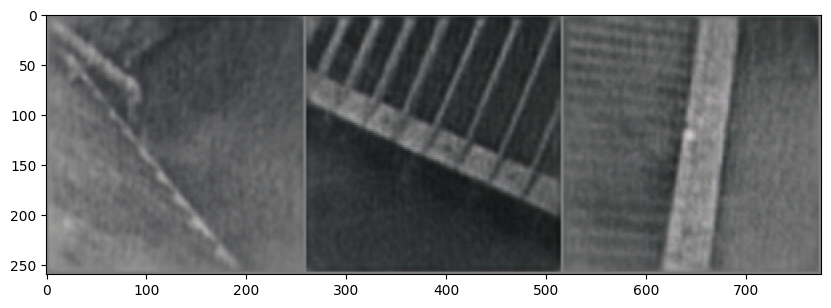

21 : learning rate 0.0000200 -> 0.0000200
epoch : 21 | total_iters : 1276 | epoch_time:7.982 | loss:5.59671688079834
22 : learning rate 0.0000200 -> 0.0000200
epoch : 22 | total_iters : 1334 | epoch_time:7.942 | loss:5.624629974365234
23 : learning rate 0.0000200 -> 0.0000200
epoch : 23 | total_iters : 1392 | epoch_time:8.011 | loss:5.974623680114746
24 : learning rate 0.0000200 -> 0.0000200
epoch : 24 | total_iters : 1450 | epoch_time:8.074 | loss:5.291471004486084
25 : learning rate 0.0000200 -> 0.0000200
epoch : 25 | total_iters : 1508 | epoch_time:7.970 | loss:5.045377254486084
26 : learning rate 0.0000200 -> 0.0000200
epoch : 26 | total_iters : 1566 | epoch_time:7.993 | loss:5.013982772827148
27 : learning rate 0.0000200 -> 0.0000200
epoch : 27 | total_iters : 1624 | epoch_time:7.968 | loss:5.026320457458496
28 : learning rate 0.0000200 -> 0.0000200
epoch : 28 | total_iters : 1682 | epoch_time:8.009 | loss:5.079837322235107
29 : learning rate 0.0000200 -> 0.0000200
epoch : 29 | to

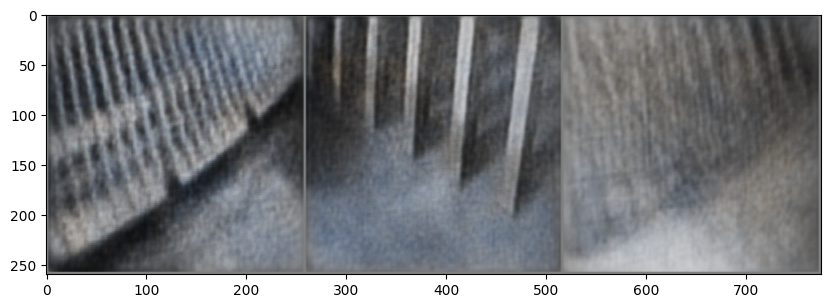

41 : learning rate 0.0000200 -> 0.0000200
epoch : 41 | total_iters : 2436 | epoch_time:8.059 | loss:4.652525901794434
42 : learning rate 0.0000200 -> 0.0000200
epoch : 42 | total_iters : 2494 | epoch_time:8.017 | loss:4.530514717102051
43 : learning rate 0.0000200 -> 0.0000200
epoch : 43 | total_iters : 2552 | epoch_time:8.027 | loss:4.660348415374756
44 : learning rate 0.0000200 -> 0.0000200
epoch : 44 | total_iters : 2610 | epoch_time:7.975 | loss:4.656129360198975
45 : learning rate 0.0000200 -> 0.0000200
epoch : 45 | total_iters : 2668 | epoch_time:8.049 | loss:4.649890899658203
46 : learning rate 0.0000200 -> 0.0000200
epoch : 46 | total_iters : 2726 | epoch_time:8.080 | loss:4.269723892211914
47 : learning rate 0.0000200 -> 0.0000200
epoch : 47 | total_iters : 2784 | epoch_time:7.976 | loss:4.210916519165039
48 : learning rate 0.0000200 -> 0.0000200
epoch : 48 | total_iters : 2842 | epoch_time:8.027 | loss:4.72987174987793
49 : learning rate 0.0000200 -> 0.0000200
epoch : 49 | to

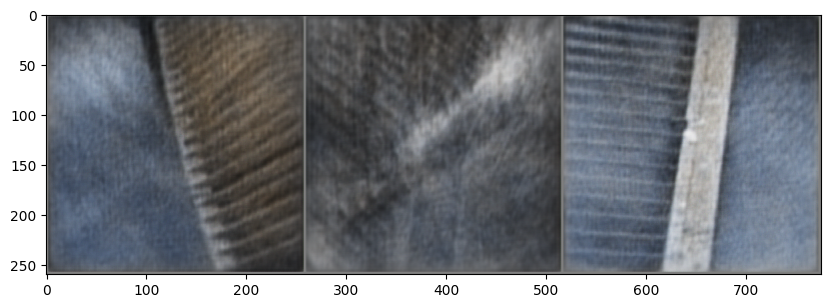

61 : learning rate 0.0000200 -> 0.0000200
epoch : 61 | total_iters : 3596 | epoch_time:8.029 | loss:3.9914565086364746
62 : learning rate 0.0000200 -> 0.0000200
epoch : 62 | total_iters : 3654 | epoch_time:7.947 | loss:4.06009578704834
63 : learning rate 0.0000200 -> 0.0000200
epoch : 63 | total_iters : 3712 | epoch_time:7.946 | loss:4.0302839279174805
64 : learning rate 0.0000200 -> 0.0000200
epoch : 64 | total_iters : 3770 | epoch_time:8.037 | loss:3.7019095420837402
65 : learning rate 0.0000200 -> 0.0000200
epoch : 65 | total_iters : 3828 | epoch_time:7.991 | loss:3.807997465133667
66 : learning rate 0.0000200 -> 0.0000200
epoch : 66 | total_iters : 3886 | epoch_time:7.984 | loss:3.9000091552734375
67 : learning rate 0.0000200 -> 0.0000200
epoch : 67 | total_iters : 3944 | epoch_time:7.999 | loss:4.157218933105469
68 : learning rate 0.0000200 -> 0.0000200
epoch : 68 | total_iters : 4002 | epoch_time:7.985 | loss:3.8676280975341797
69 : learning rate 0.0000200 -> 0.0000200
epoch : 69

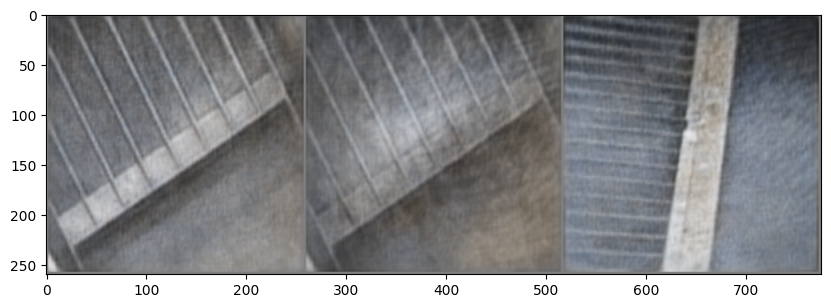

81 : learning rate 0.0000200 -> 0.0000200
epoch : 81 | total_iters : 4756 | epoch_time:8.021 | loss:3.9910659790039062
82 : learning rate 0.0000200 -> 0.0000200
epoch : 82 | total_iters : 4814 | epoch_time:7.989 | loss:3.6868796348571777
83 : learning rate 0.0000200 -> 0.0000200
epoch : 83 | total_iters : 4872 | epoch_time:8.045 | loss:3.4387869834899902
84 : learning rate 0.0000200 -> 0.0000200
epoch : 84 | total_iters : 4930 | epoch_time:7.982 | loss:3.6181750297546387
85 : learning rate 0.0000200 -> 0.0000200
epoch : 85 | total_iters : 4988 | epoch_time:7.999 | loss:3.778806209564209
86 : learning rate 0.0000200 -> 0.0000200
epoch : 86 | total_iters : 5046 | epoch_time:8.013 | loss:3.525615692138672
87 : learning rate 0.0000200 -> 0.0000200
epoch : 87 | total_iters : 5104 | epoch_time:8.000 | loss:3.6001434326171875
88 : learning rate 0.0000200 -> 0.0000200
epoch : 88 | total_iters : 5162 | epoch_time:8.018 | loss:3.8196828365325928
89 : learning rate 0.0000200 -> 0.0000200
epoch : 

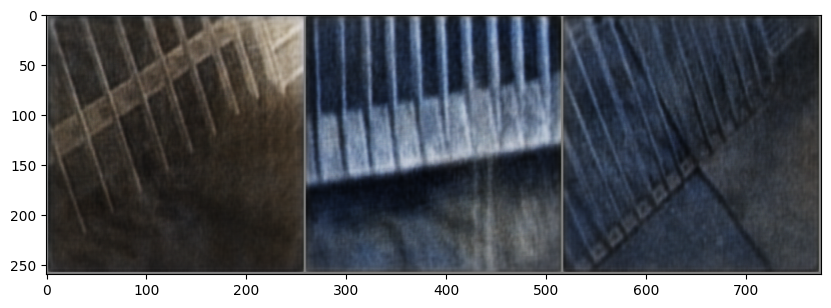

101 : learning rate 0.0000200 -> 0.0000200
epoch : 101 | total_iters : 5916 | epoch_time:8.065 | loss:3.570107936859131
102 : learning rate 0.0000200 -> 0.0000200
epoch : 102 | total_iters : 5974 | epoch_time:7.995 | loss:3.3762855529785156
103 : learning rate 0.0000200 -> 0.0000200
epoch : 103 | total_iters : 6032 | epoch_time:8.001 | loss:3.41282057762146
104 : learning rate 0.0000200 -> 0.0000200
epoch : 104 | total_iters : 6090 | epoch_time:8.009 | loss:3.526773452758789
105 : learning rate 0.0000200 -> 0.0000200
epoch : 105 | total_iters : 6148 | epoch_time:8.068 | loss:3.278646230697632
106 : learning rate 0.0000200 -> 0.0000200
epoch : 106 | total_iters : 6206 | epoch_time:8.070 | loss:3.368342876434326
107 : learning rate 0.0000200 -> 0.0000200
epoch : 107 | total_iters : 6264 | epoch_time:7.986 | loss:3.6586785316467285
108 : learning rate 0.0000200 -> 0.0000200
epoch : 108 | total_iters : 6322 | epoch_time:8.014 | loss:3.4614367485046387
109 : learning rate 0.0000200 -> 0.000

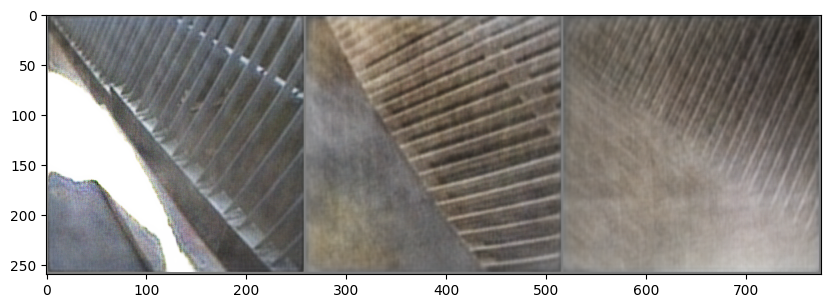

121 : learning rate 0.0000200 -> 0.0000200
epoch : 121 | total_iters : 7076 | epoch_time:7.938 | loss:3.173426389694214
122 : learning rate 0.0000200 -> 0.0000200
epoch : 122 | total_iters : 7134 | epoch_time:7.938 | loss:3.3273162841796875
123 : learning rate 0.0000200 -> 0.0000200
epoch : 123 | total_iters : 7192 | epoch_time:8.003 | loss:3.394782543182373
124 : learning rate 0.0000200 -> 0.0000200
epoch : 124 | total_iters : 7250 | epoch_time:8.042 | loss:3.433276653289795
125 : learning rate 0.0000200 -> 0.0000200
epoch : 125 | total_iters : 7308 | epoch_time:7.997 | loss:3.060039520263672
126 : learning rate 0.0000200 -> 0.0000200
epoch : 126 | total_iters : 7366 | epoch_time:8.038 | loss:3.3718955516815186
127 : learning rate 0.0000200 -> 0.0000200
epoch : 127 | total_iters : 7424 | epoch_time:8.033 | loss:3.2330856323242188
128 : learning rate 0.0000200 -> 0.0000200
epoch : 128 | total_iters : 7482 | epoch_time:8.120 | loss:3.578881025314331
129 : learning rate 0.0000200 -> 0.00

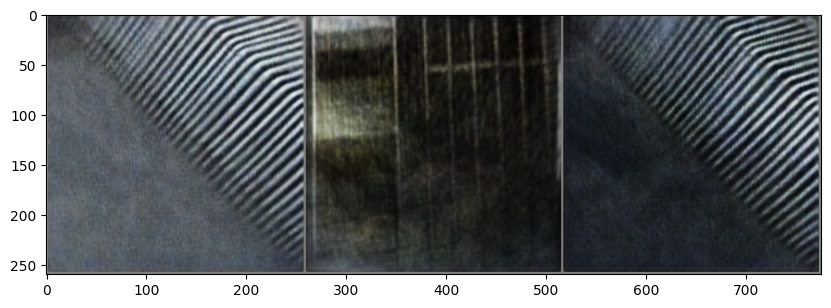

141 : learning rate 0.0000200 -> 0.0000200
epoch : 141 | total_iters : 8236 | epoch_time:7.961 | loss:3.173050880432129
142 : learning rate 0.0000200 -> 0.0000200
epoch : 142 | total_iters : 8294 | epoch_time:8.084 | loss:3.074573516845703
143 : learning rate 0.0000200 -> 0.0000200
epoch : 143 | total_iters : 8352 | epoch_time:8.009 | loss:3.1616199016571045
144 : learning rate 0.0000200 -> 0.0000200
epoch : 144 | total_iters : 8410 | epoch_time:7.986 | loss:3.0158774852752686
145 : learning rate 0.0000200 -> 0.0000200
epoch : 145 | total_iters : 8468 | epoch_time:7.976 | loss:2.920940399169922
146 : learning rate 0.0000200 -> 0.0000200
epoch : 146 | total_iters : 8526 | epoch_time:7.993 | loss:3.2951531410217285
147 : learning rate 0.0000200 -> 0.0000200
epoch : 147 | total_iters : 8584 | epoch_time:8.019 | loss:3.0101325511932373
148 : learning rate 0.0000200 -> 0.0000200
epoch : 148 | total_iters : 8642 | epoch_time:7.994 | loss:3.002969741821289
149 : learning rate 0.0000200 -> 0.0

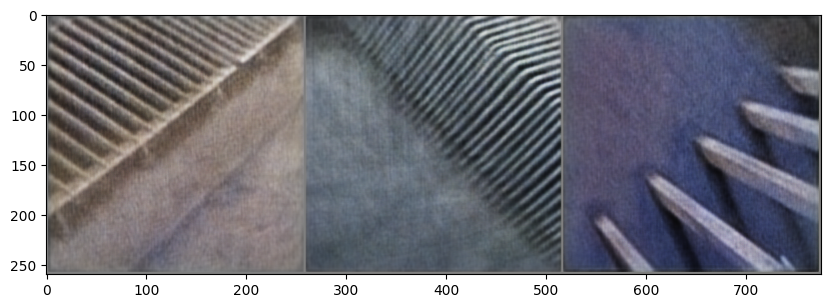

161 : learning rate 0.0000200 -> 0.0000200
epoch : 161 | total_iters : 9396 | epoch_time:7.982 | loss:2.9101436138153076
162 : learning rate 0.0000200 -> 0.0000200
epoch : 162 | total_iters : 9454 | epoch_time:8.047 | loss:2.868739604949951
163 : learning rate 0.0000200 -> 0.0000200
epoch : 163 | total_iters : 9512 | epoch_time:8.074 | loss:2.8769302368164062
164 : learning rate 0.0000200 -> 0.0000200
epoch : 164 | total_iters : 9570 | epoch_time:8.048 | loss:2.730070114135742
165 : learning rate 0.0000200 -> 0.0000200
epoch : 165 | total_iters : 9628 | epoch_time:8.055 | loss:2.932826519012451
166 : learning rate 0.0000200 -> 0.0000200
epoch : 166 | total_iters : 9686 | epoch_time:8.093 | loss:2.9487438201904297
167 : learning rate 0.0000200 -> 0.0000200
epoch : 167 | total_iters : 9744 | epoch_time:8.140 | loss:2.6819262504577637
168 : learning rate 0.0000200 -> 0.0000200
epoch : 168 | total_iters : 9802 | epoch_time:8.090 | loss:2.8059964179992676
169 : learning rate 0.0000200 -> 0.

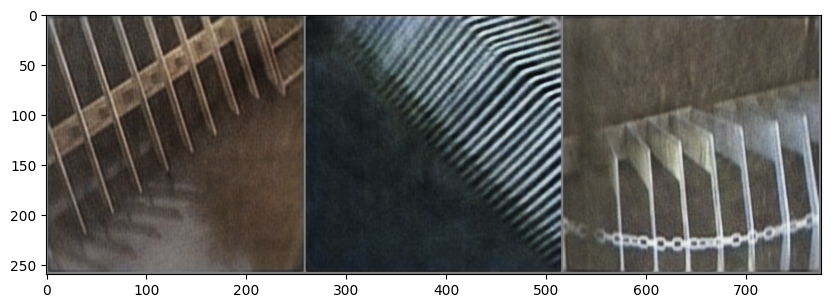

181 : learning rate 0.0000197 -> 0.0000193
epoch : 181 | total_iters : 10556 | epoch_time:8.111 | loss:3.029259443283081
182 : learning rate 0.0000193 -> 0.0000190
epoch : 182 | total_iters : 10614 | epoch_time:8.079 | loss:2.8037803173065186
183 : learning rate 0.0000190 -> 0.0000187
epoch : 183 | total_iters : 10672 | epoch_time:8.090 | loss:2.920900344848633
184 : learning rate 0.0000187 -> 0.0000184
epoch : 184 | total_iters : 10730 | epoch_time:8.026 | loss:2.842332363128662
185 : learning rate 0.0000184 -> 0.0000180
epoch : 185 | total_iters : 10788 | epoch_time:8.067 | loss:3.1342990398406982
186 : learning rate 0.0000180 -> 0.0000177
epoch : 186 | total_iters : 10846 | epoch_time:8.089 | loss:2.8680522441864014
187 : learning rate 0.0000177 -> 0.0000174
epoch : 187 | total_iters : 10904 | epoch_time:8.084 | loss:2.6506075859069824
188 : learning rate 0.0000174 -> 0.0000170
epoch : 188 | total_iters : 10962 | epoch_time:8.084 | loss:2.945845365524292
189 : learning rate 0.000017

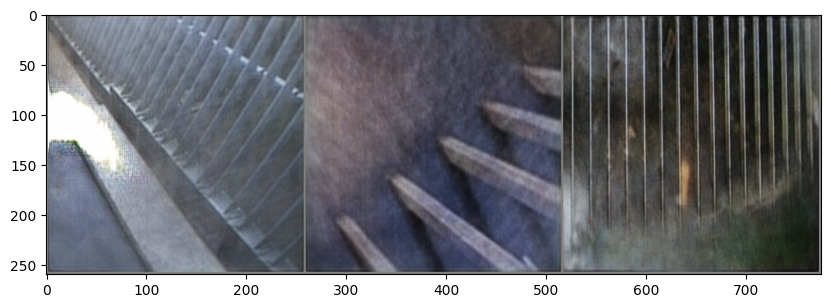

201 : learning rate 0.0000131 -> 0.0000128
epoch : 201 | total_iters : 11716 | epoch_time:8.065 | loss:2.7730607986450195
202 : learning rate 0.0000128 -> 0.0000125
epoch : 202 | total_iters : 11774 | epoch_time:8.060 | loss:2.6183266639709473
203 : learning rate 0.0000125 -> 0.0000121
epoch : 203 | total_iters : 11832 | epoch_time:8.053 | loss:2.721043109893799
204 : learning rate 0.0000121 -> 0.0000118
epoch : 204 | total_iters : 11890 | epoch_time:8.069 | loss:2.7323789596557617
205 : learning rate 0.0000118 -> 0.0000115
epoch : 205 | total_iters : 11948 | epoch_time:8.027 | loss:2.7389163970947266
206 : learning rate 0.0000115 -> 0.0000111
epoch : 206 | total_iters : 12006 | epoch_time:8.028 | loss:2.8860111236572266
207 : learning rate 0.0000111 -> 0.0000108
epoch : 207 | total_iters : 12064 | epoch_time:8.028 | loss:2.5551912784576416
208 : learning rate 0.0000108 -> 0.0000105
epoch : 208 | total_iters : 12122 | epoch_time:8.001 | loss:2.6994330883026123
209 : learning rate 0.000

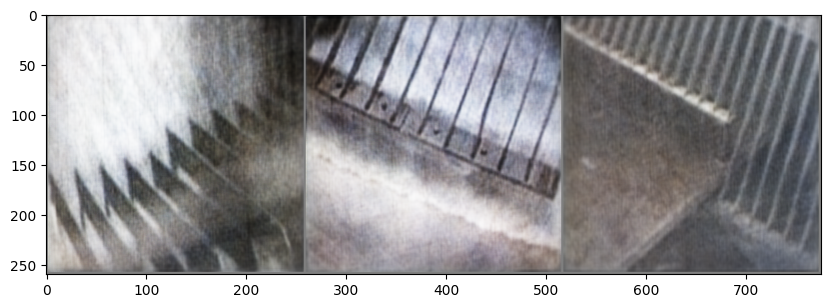

221 : learning rate 0.0000066 -> 0.0000062
epoch : 221 | total_iters : 12876 | epoch_time:8.073 | loss:2.94681978225708
222 : learning rate 0.0000062 -> 0.0000059
epoch : 222 | total_iters : 12934 | epoch_time:8.039 | loss:2.7354867458343506
223 : learning rate 0.0000059 -> 0.0000056
epoch : 223 | total_iters : 12992 | epoch_time:8.090 | loss:2.7584941387176514
224 : learning rate 0.0000056 -> 0.0000052
epoch : 224 | total_iters : 13050 | epoch_time:8.087 | loss:2.8932056427001953
225 : learning rate 0.0000052 -> 0.0000049
epoch : 225 | total_iters : 13108 | epoch_time:8.120 | loss:2.6184723377227783
226 : learning rate 0.0000049 -> 0.0000046
epoch : 226 | total_iters : 13166 | epoch_time:8.100 | loss:2.566619634628296
227 : learning rate 0.0000046 -> 0.0000043
epoch : 227 | total_iters : 13224 | epoch_time:8.038 | loss:2.71907114982605
228 : learning rate 0.0000043 -> 0.0000039
epoch : 228 | total_iters : 13282 | epoch_time:8.072 | loss:2.551992893218994
229 : learning rate 0.0000039 

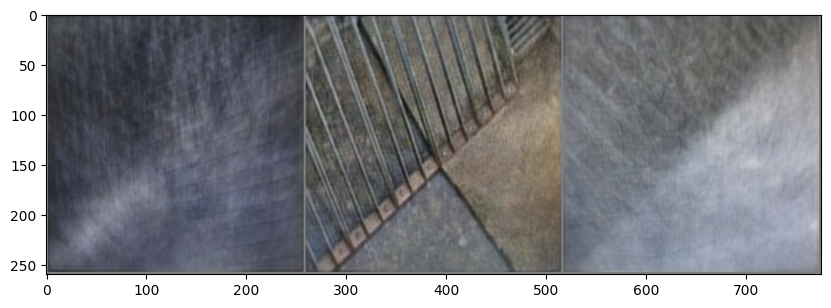

241 : learning rate 0.0000000 -> -0.0000003
epoch : 241 | total_iters : 14036 | epoch_time:8.067 | loss:11.575626373291016
encoder saved in:  vae_v2_saved_models/aae/notrash/cae_e_241.pth
decoder saved in:  vae_v2_saved_models/aae/notrash/cae_d_241.pth


In [7]:
data_loader = CustomDatasetDataLoader(opt, dataset)
dataset_loaded = data_loader.load_data()

opt.mode="train"

all_losses = defaultdict(list)

model = CAE(opt)       # create model (AE, AAE)
model.setup(opt)   
total_iters = 0
loss_name = model.loss_name            # loss name for naming 



for epoch in range(opt.epoch_count, opt.n_epochs + opt.n_epochs_decay + 1):
    epoch_start_time = time.time()                      # start epoch time
    model.update_learning_rate(epoch)                   # update learning rate change with schedulers
    epoch_iters = 0

    for i, data in enumerate(dataset_loaded):                  # dataset loop
        iter_start_time = time.time()                   # start iter time
        model.set_input(data)                           # unpacking input data for processing
        model.train()                                   # start model train
        total_iters += 1
        epoch_iters += 1
    if epoch % opt.print_epoch_freq == 0:               # model loss, time print frequency
        losses = model.get_current_losses(*loss_name)
        epoch_time = time.time() - epoch_start_time
        message = f"epoch : {epoch} | total_iters : {total_iters} | epoch_time:{epoch_time:.3f}"
        for k,v in losses.items():
            message += f" | {k}:{v}"
            all_losses[k].append(v)
        print(message)
    if epoch % opt.save_epoch_freq == 0:                # save model frequency
        print(
            "saving the latest model (epoch %d, total_iters %d)"
            % (epoch, total_iters)
        )
        model.save_networks(epoch)
        utils.plt_show(model.generated_imgs[:3], opt.means, opt.stds)
model.save_networks(epoch)

In [10]:
import pickle
with open('train_losse_s_cae_v1.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(all_losses, f)

In [13]:
all_losses.keys()

dict_keys(['loss', 'recon_loss', 'dm_loss', 'g_loss'])

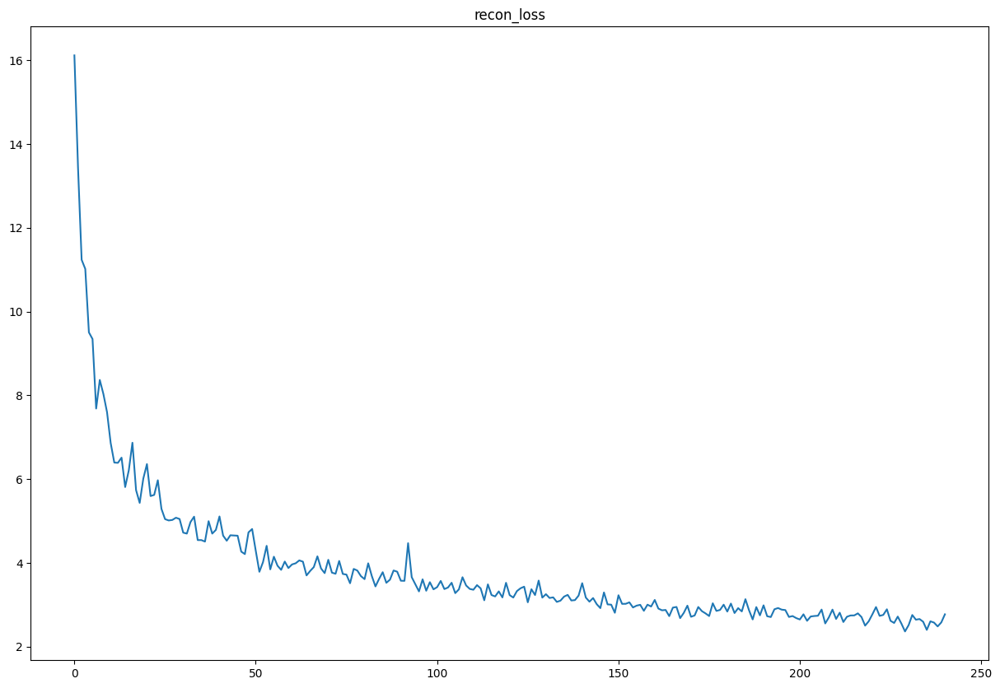

In [8]:
fig, axes = plt.subplots(1,1, figsize=(15,10))
axes.plot(range(len(all_losses["loss"])-1), all_losses["loss"][:-1])
axes.set_title("recon_loss")
# axes[1].plot(range(len(all_losses["dm_loss"])-1), all_losses["dm_loss"][:-1])
# axes[1].set_title("recon_loss")
# axes[2].plot(range(len(all_losses["g_loss"])-1), all_losses["g_loss"][:-1])
# axes[2].set_title("recon_loss")
plt.show()

In [16]:
opt.verbose=True
opt.mode="test"
opt.threshold = 0.4    # get test options
opt.batch_size = 1
opt.trained_encoder_name = "aae_e_220.pth"
opt.trained_decoder_name = "aae_d_220.pth"

test_dataset = TrashDataset("../student_db", transform=get_test_transform(opt), train=False, grayscale=False, subset=True)
test_dataset_size = len(test_dataset)
test_data_loader = CustomDatasetDataLoader(opt, test_dataset)
test_dataset_loaded = test_data_loader.load_data()
print(f"Training size is = {test_dataset_size}")

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 208 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 316 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 424 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 556 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 688 tasks      | elapsed:    0.2s


Training size is = 1000


[Parallel(n_jobs=8)]: Done 844 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 1000 out of 1000 | elapsed:    0.2s finished


#### Compare predictions and real on Test dataset

loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_220.pth
---------- Networks initialized -------------
DataParallel(
  (module): Encoder(
    (model): Sequential(
      (0): Conv2d(3, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
      (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (4): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (5): LeakyReLU(negative_slope=0.2, inplace=True)
      (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (7): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (8): LeakyReLU(negative_slope=0.2, inplace=True)
      (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1

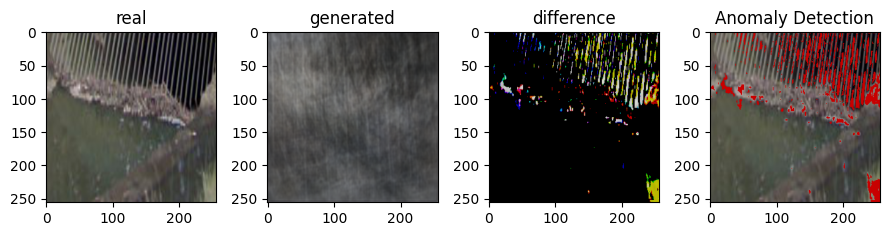

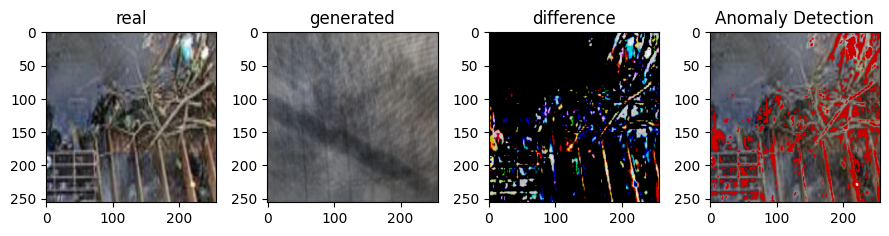

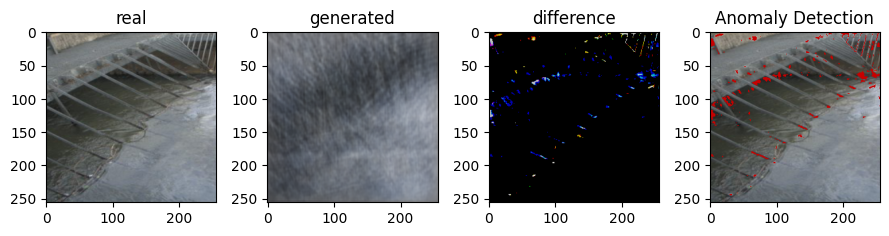

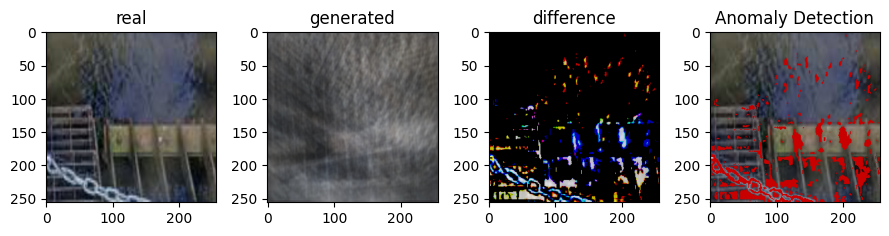

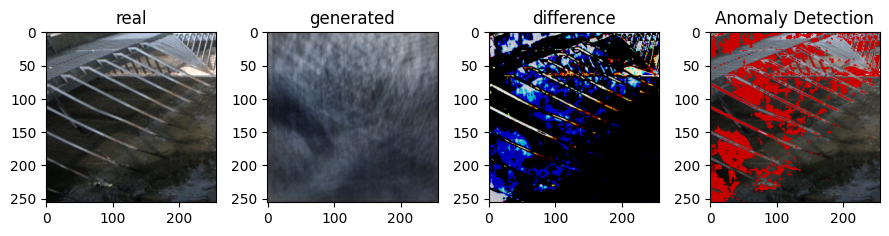

...

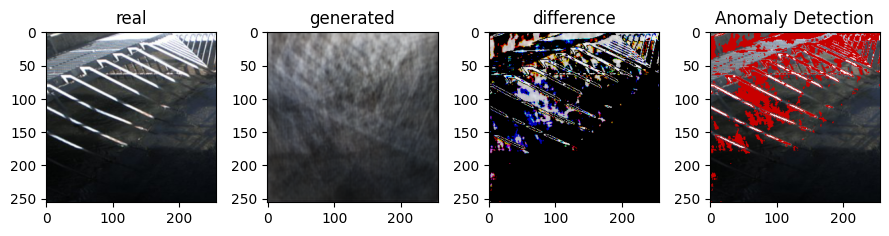

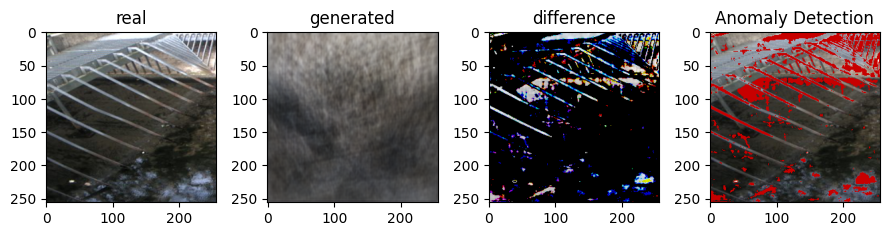

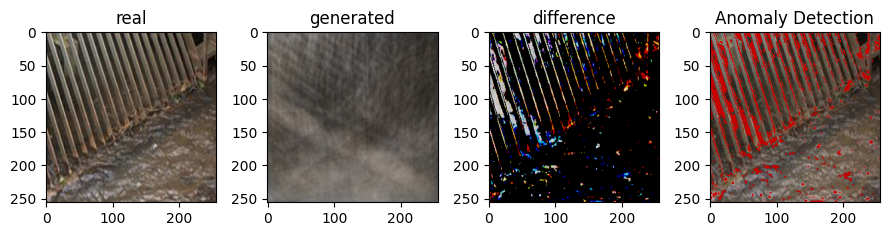

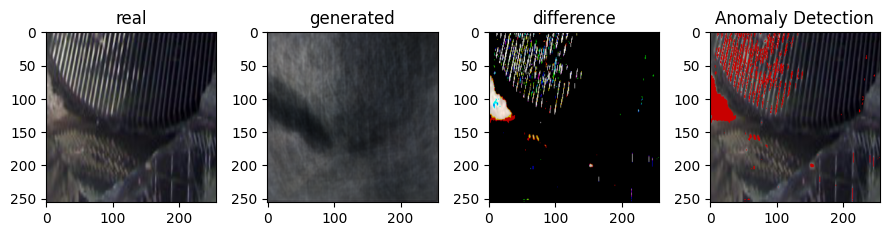

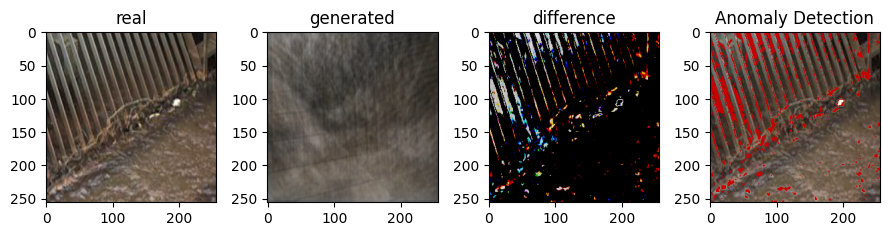

end Test


In [17]:

model = CAE(opt)       # create model (AE, AAE)
model.setup(opt)                # set model : if mode is 'train', define schedulers and if mode is 'test', load saved networks
model.eval()                    # model eval version
for i, data in enumerate(test_data_loader):

    epoch_start_time = time.time()
    model.set_input(data)
    model.test()

    generated_images = model.get_generated_imags()
    epoch_time = time.time() - epoch_start_time
    # print(f"{i} epoch_time : {epoch_time:.3f}")
    
    model.save_images(data)
    if i == 10:
        break
print("end Test")

### Compare prediction and real on validation dataset

loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_220.pth
---------- Networks initialized -------------
DataParallel(
  (module): Encoder(
    (model): Sequential(
      (0): Conv2d(3, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
      (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (4): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (5): LeakyReLU(negative_slope=0.2, inplace=True)
      (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (7): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (8): LeakyReLU(negative_slope=0.2, inplace=True)
      (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1

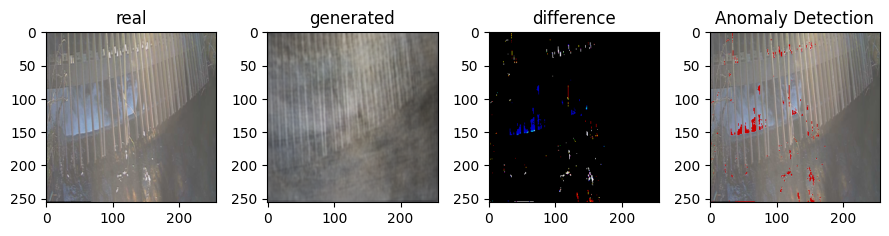

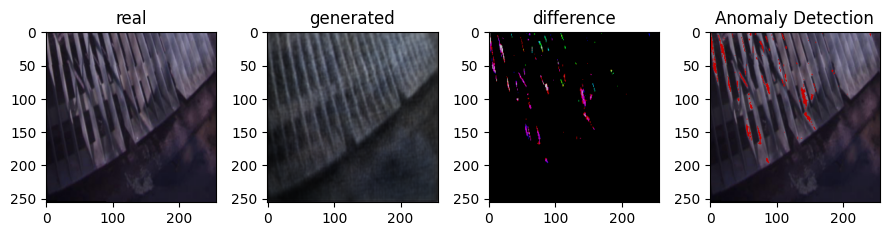

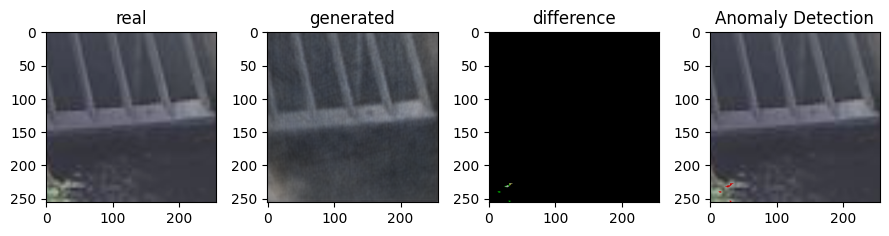

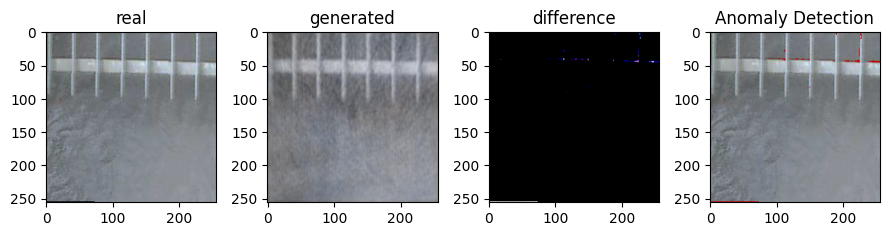

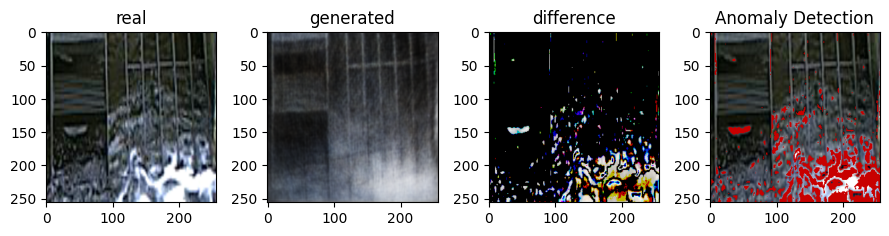

...

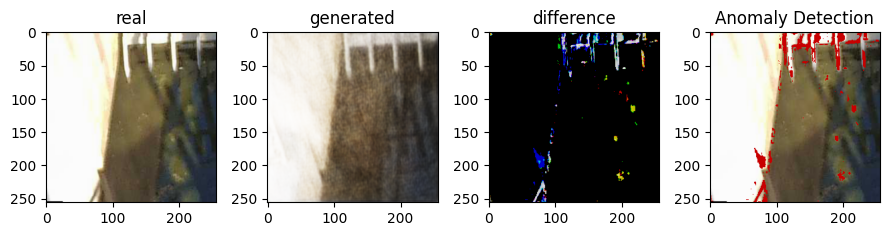

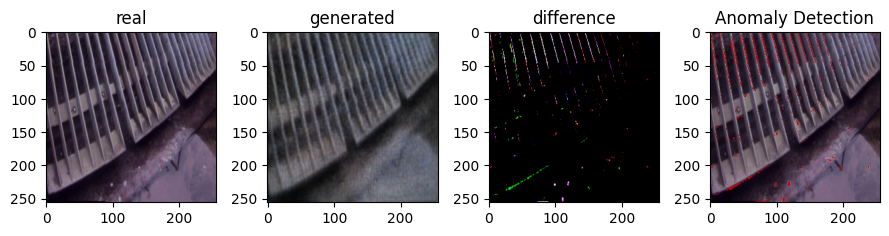

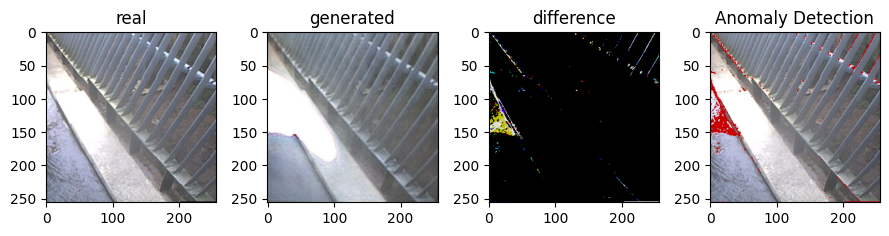

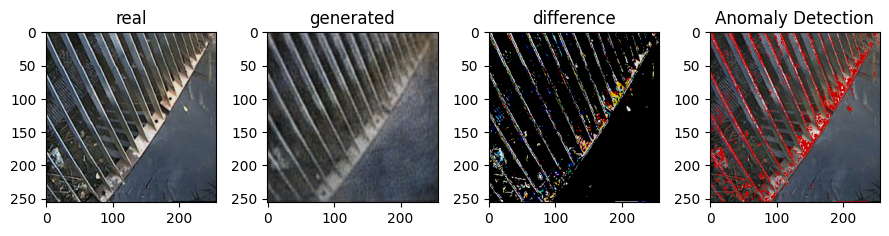

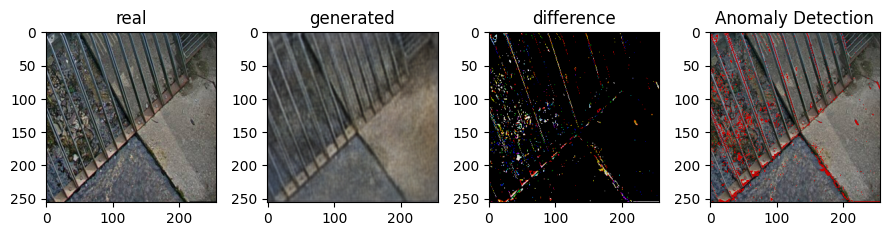

end Test


In [18]:
opt.batch_size = 1
valid_data_loader = CustomDatasetDataLoader(opt, dataset)
valid_dataset_loaded = valid_data_loader.load_data()

model = CAE(opt)       # create model (AE, AAE)
model.setup(opt)                # set model : if mode is 'train', define schedulers and if mode is 'test', load saved networks
model.eval()                    # model eval version
for i, data in enumerate(valid_dataset_loaded):
    # data = loaded_dataset[random.randint(0,len(loaded_dataset))]
    # print(data)
    # img_data = data["img"][0].cpu().numpy()
    # for j in range(3):
    #     img_data[j] = (img_data[j] * opt.stds[j] + opt.means[j])
    # img_data = np.transpose(img_data, (1, 2, 0))
    # plt.imshow(img_data)
    # plt.show()

    epoch_start_time = time.time()
    model.set_input(data)
    model.test()

    generated_images = model.get_generated_imags()
    epoch_time = time.time() - epoch_start_time
    # print(f"{i} epoch_time : {epoch_time:.3f}")
    
    model.save_images(data)
    if i == 10:
        break
print("end Test")

In [17]:
print("Running Test")
opt.mode="test"
opt.threshold = 0.2    # get test options
opt.batch_size = 1

test_dataset = TrashDataset("../student_db", transform=get_transform(opt), train=False, grayscale=False, subset=False)
test_dataset_size = len(test_dataset)
test_data_loader = CustomDatasetDataLoader(opt, test_dataset)
test_dataset_loaded = test_data_loader.load_data()

Running Test


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 416 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 1816 tasks      | elapsed:    0.7s
[Parallel(n_jobs=8)]: Done 2286 tasks      | elapsed:    0.8s
[Parallel(n_jobs=8)]: Done 2598 tasks      | elapsed:    0.8s
[Parallel(n_jobs=8)]: Done 2910 tasks      | elapsed:    0.8s
[Parallel(n_jobs=8)]: Done 3064 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 3218 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 3400 tasks      | elapsed:    1.0s
[Parallel(n_jobs=8)]: Done 3768 tasks      | elapsed:    1.0s
[Parallel(n_jobs=8)]: Done 4400 out of 4400 | elapsed:    1.1s finished


In [19]:
def evaluate(dataset, ignorance_threshold, opt):
    opt.verbose = False

    all_actual_predictions = {}
    all_diffs = {}
    saved_epochs = [240, 220,200,180,160,140,120,100,80,60,40,20] 
    for epoch in saved_epochs:
        opt.trained_encoder_name = f"cae_e_{epoch}.pth"
        opt.trained_decoder_name = f"cae_d_{epoch}.pth"

        predictions = []
        actual = []

        all_diffs_per_epoch = defaultdict(list)
        model = CAE(opt)       # create model (AE, AAE)
        model.setup(opt)                # set model : if mode is 'train', define schedulers and if mode is 'test', load saved networks
        model.eval()                    # model eval version
        for i, data in enumerate(dataset):
            epoch_start_time = time.time()
            model.set_input(data)
            model.test()

            generated_images = model.get_generated_imags()
            epoch_time = time.time() - epoch_start_time


            diff_img = np.abs(data["img"][0].numpy() - generated_images[0].cpu().numpy())
            diff_img[diff_img < ignorance_threshold*0.5+0.5] = 0
            diff = np.sum(diff_img)

            if diff < 2500:
                predictions.append("notrash")
            else:
                predictions.append("trash")
            # print(data["path"])
            if "notrash"in data["path"][0]:
                actual.append("notrash")
            else:
                actual.append("trash")
            

            all_diffs_per_epoch["notrash" if "notrash"in data["path"][0] else "trash"].append(diff)
            # model.save_images(data)
        
        all_actual_predictions[epoch] = (actual, predictions)
        all_diffs[epoch] = all_diffs_per_epoch

    return all_diffs,all_actual_predictions

### Calculate loss with 0.2 as ignorance threshold

In [20]:
all_diffs_1,all_actual_predictions_1 = evaluate(test_dataset_loaded, 0.2, opt)

loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_240.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_240.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
-----------------------------------------------


loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_220.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_200.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_200.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_180.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_180.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
----

Mean of trash losses 3468.8105
Mean of No trash losses 2561.943
Diff of means 906.86743


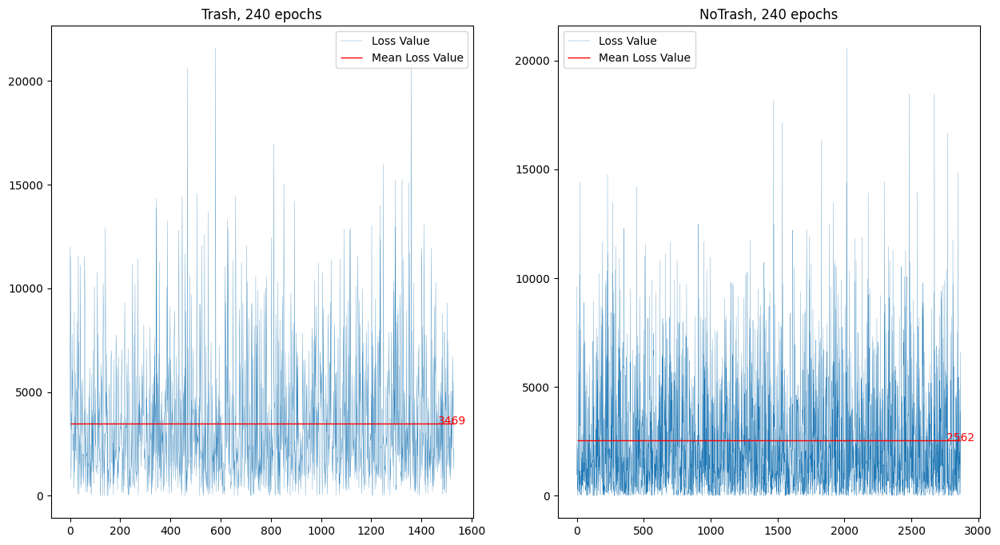

Mean of trash losses 3501.9849
Mean of No trash losses 2553.2869
Diff of means 948.698


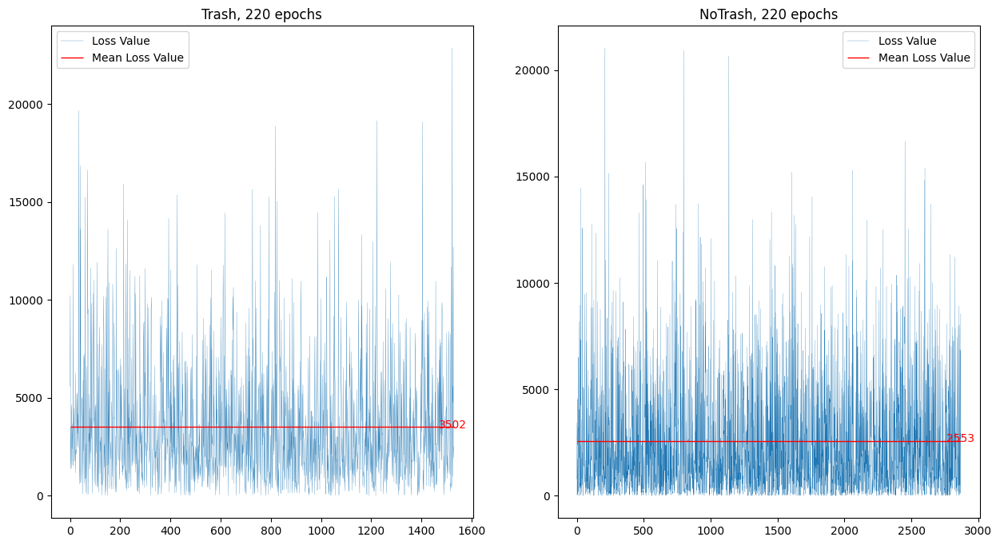

Mean of trash losses 3456.966
Mean of No trash losses 2473.5745
Diff of means 983.3916


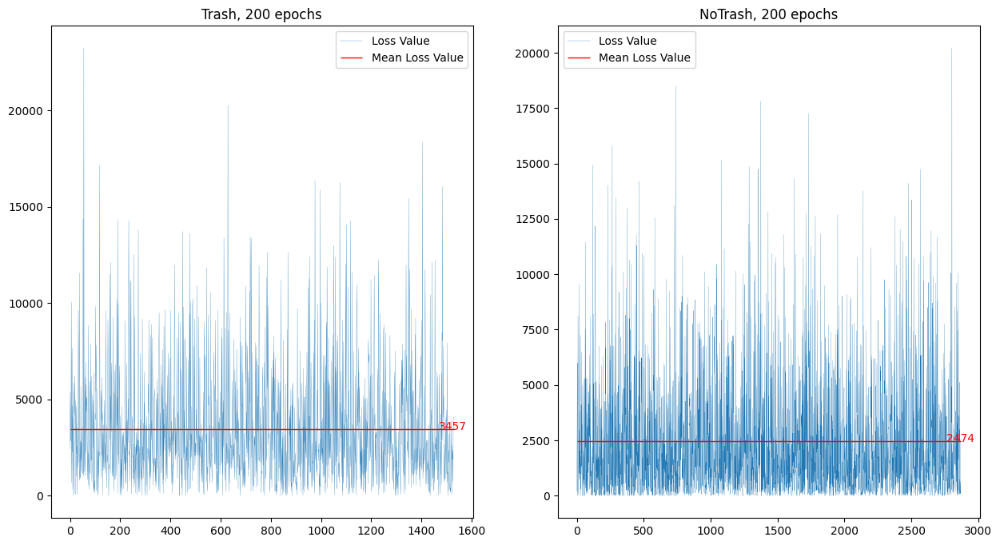

Mean of trash losses 3620.3337
Mean of No trash losses 2579.842
Diff of means 1040.4917


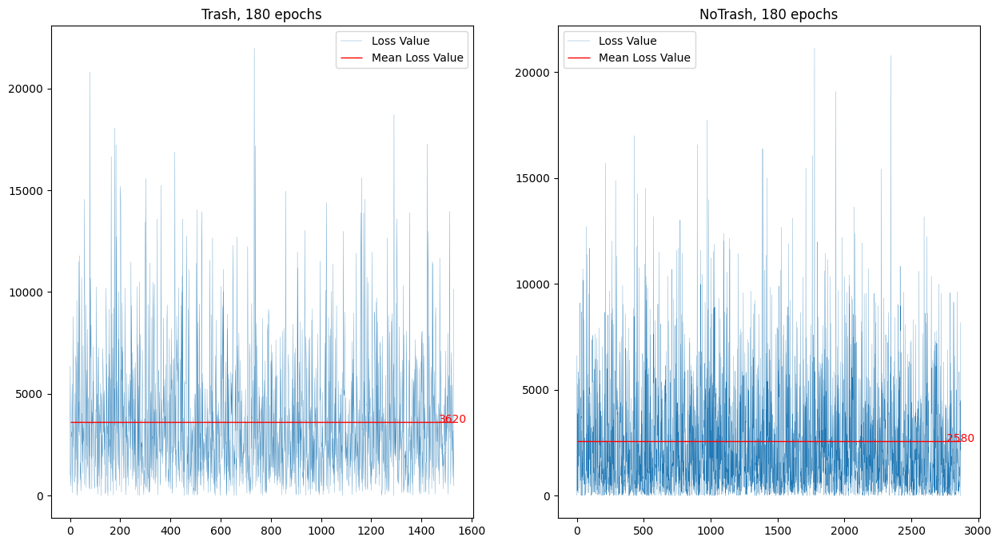

Mean of trash losses 3751.1208
Mean of No trash losses 2709.3684
Diff of means 1041.7524


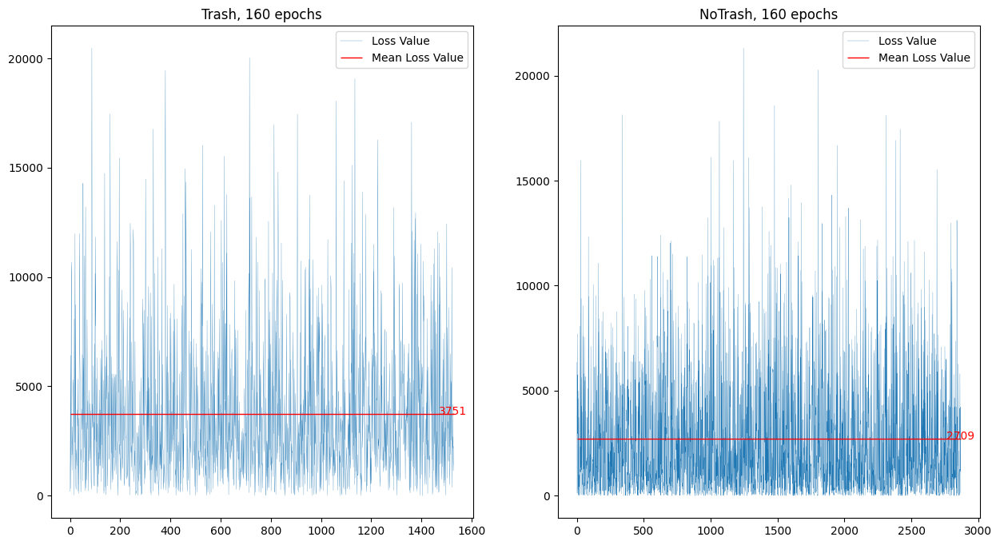

Mean of trash losses 4039.0967
Mean of No trash losses 2828.2131
Diff of means 1210.8835


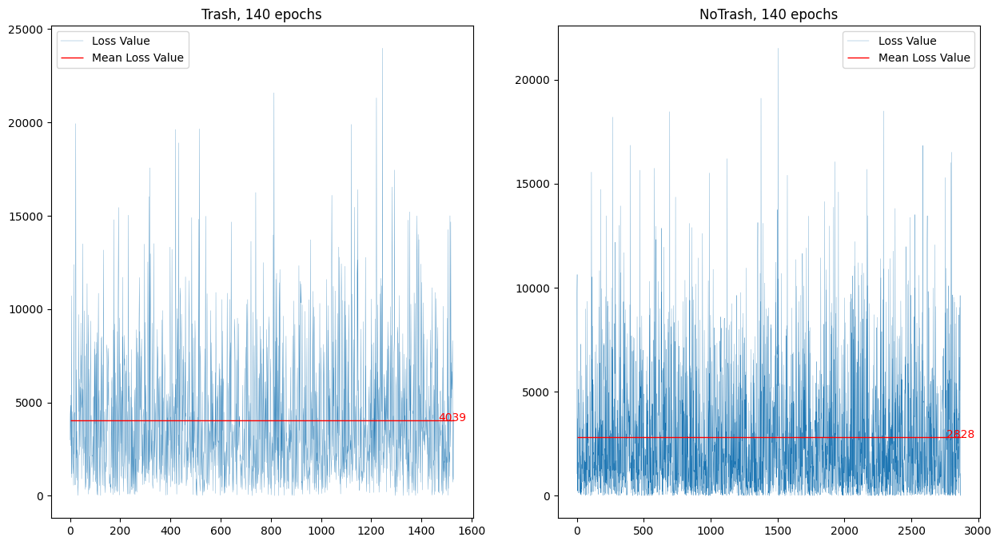

Mean of trash losses 4481.2446
Mean of No trash losses 3163.4077
Diff of means 1317.8369


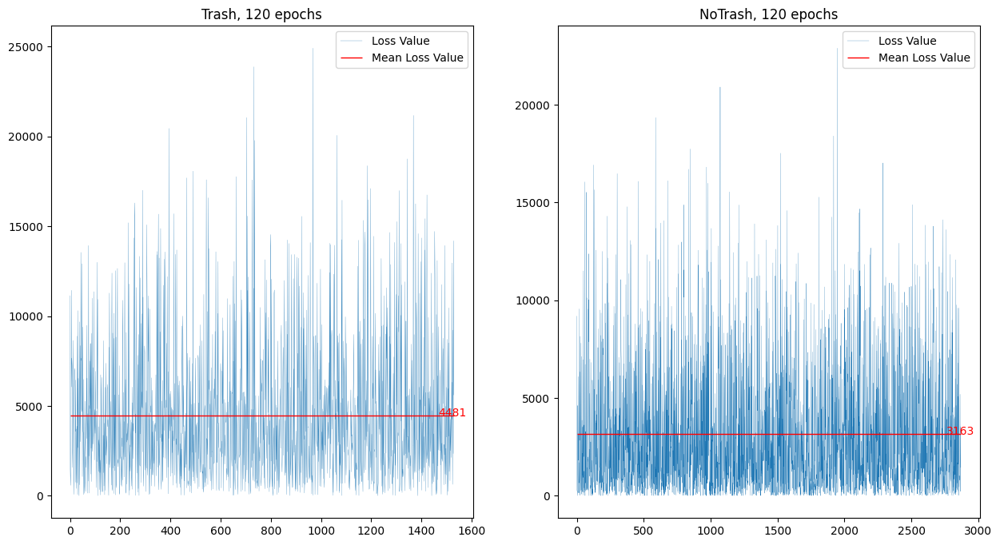

Mean of trash losses 4848.1196
Mean of No trash losses 3624.4668
Diff of means 1223.6528


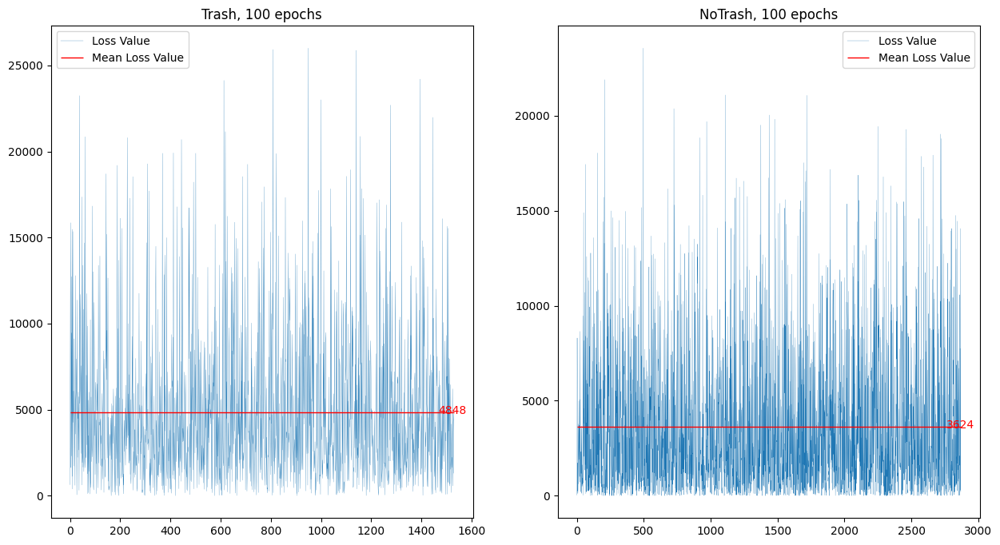

Mean of trash losses 5065.0703
Mean of No trash losses 3778.0254
Diff of means 1287.0449


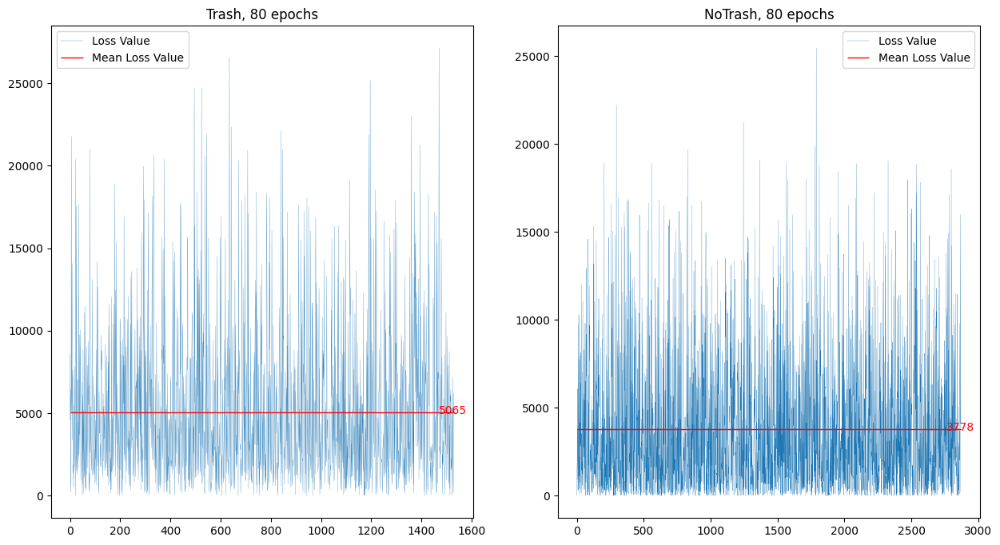

Mean of trash losses 5635.5933
Mean of No trash losses 4321.8174
Diff of means 1313.7759


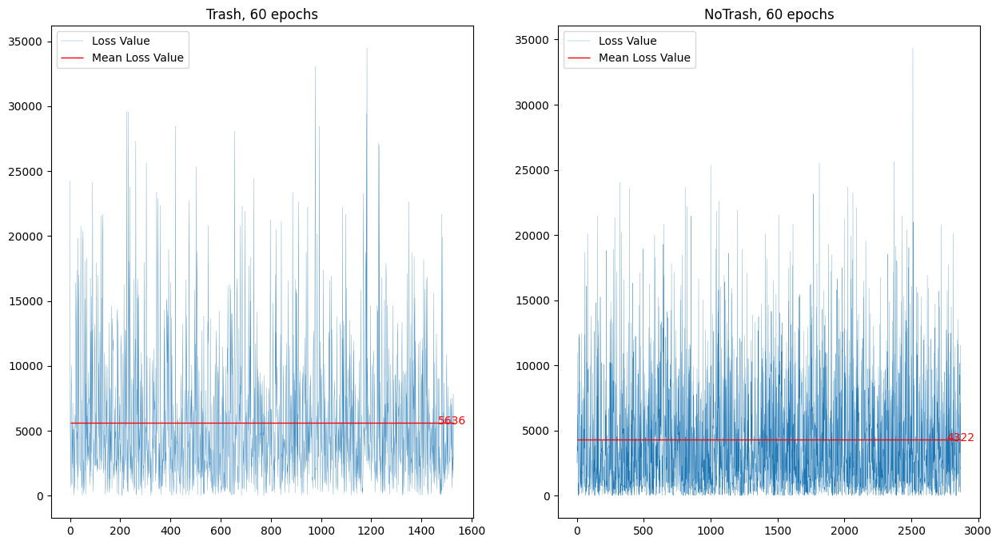

Mean of trash losses 7110.311
Mean of No trash losses 5669.03
Diff of means 1441.2812


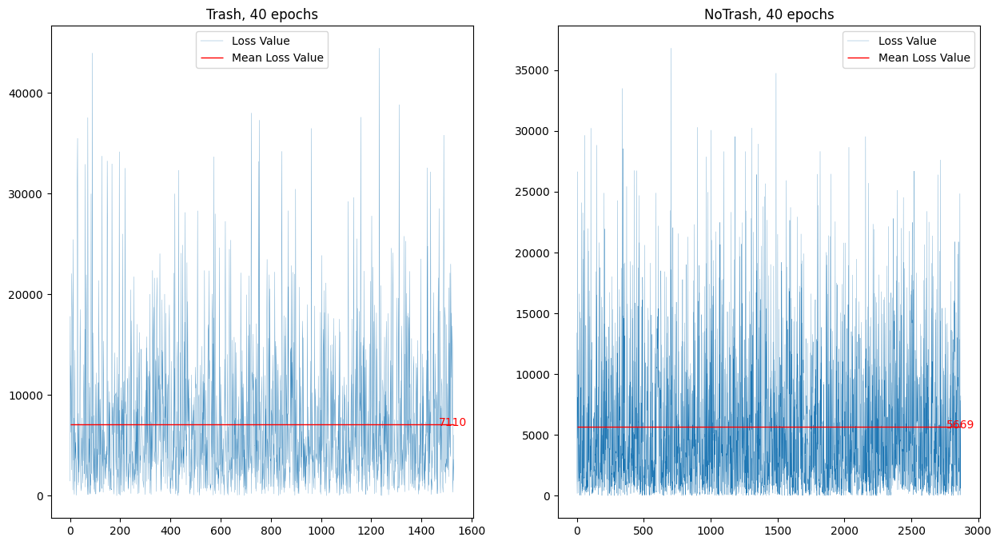

Mean of trash losses 5837.2705
Mean of No trash losses 4804.857
Diff of means 1032.4136


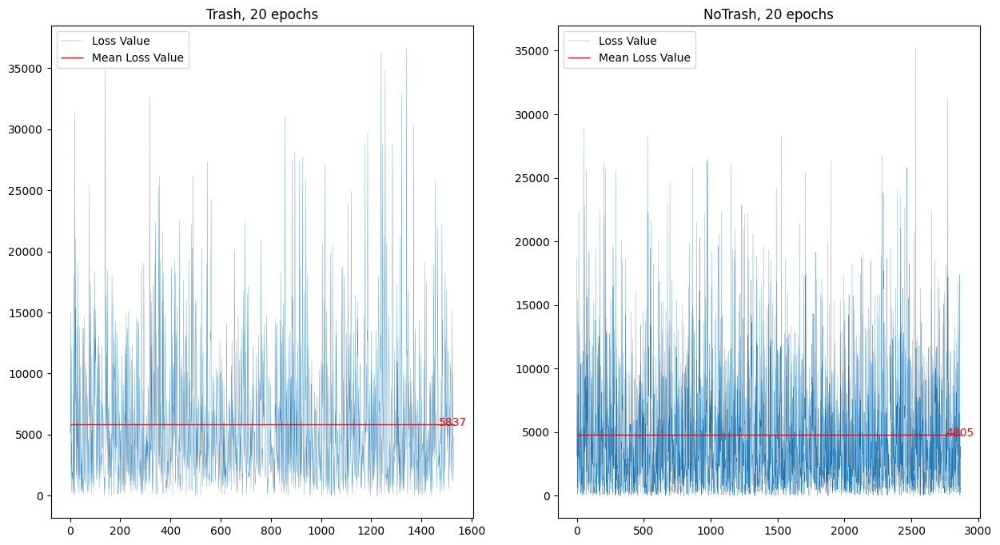

In [22]:
for epoch, diffs in  all_diffs_1.items():

    diffs_trash = diffs["trash"]
    diffs_notrash = diffs["notrash"]

    len_diffs_trash = len(diffs_trash)
    len_diffs_notrash = len(diffs_notrash)

    mean_loss_trash = np.mean(diffs_trash)
    mean_loss_no_trash = np.mean(diffs_notrash)



    print("Mean of trash losses", mean_loss_trash)
    print("Mean of No trash losses", mean_loss_no_trash)
    print("Diff of means", np.abs(mean_loss_no_trash - mean_loss_trash))
    
    fig, axes = plt.subplots(1,2, figsize=(15,8))
    axes[0].plot(range(len_diffs_trash), diffs_trash, linewidth=.2, label="Loss Value")
    axes[0].set_title(f"Trash, {epoch} epochs")
    axes[0].hlines(y=mean_loss_trash, xmin=0, xmax=len_diffs_trash, linewidth=1, color='r', label="Mean Loss Value")
    axes[0].text(len_diffs_trash+50,mean_loss_trash+110, "{:.0f}".format(mean_loss_trash), color="red", ha="right", va="center")
    axes[0].legend()
    axes[1].plot(range(len_diffs_notrash), diffs_notrash,linewidth=.2, label="Loss Value")
    axes[1].set_title(f"NoTrash, {epoch} epochs")
    axes[1].hlines(y=mean_loss_no_trash, xmin=0, xmax=len_diffs_notrash, linewidth=1, color='r', label="Mean Loss Value")
    axes[1].text(len_diffs_notrash+100,mean_loss_no_trash+110, "{:.0f}".format(mean_loss_no_trash), color="red", ha="right", va="center")
    axes[1].legend()
    plt.show()

In [23]:
def balanced_accuracy(tp,tn,fp,fn):
    return (0.5*(tp/(tp+fn))) + (0.5*(tn/(tn+fp)))

def calculate_metrics(all_actual_predictions:dict):
    all_balanced_accuracy = {}
    for epoch, (act, pred) in all_actual_predictions.items():
        true_pos, true_neg, false_pos, false_neg = 0, 0, 1, 1
        for i in range(len(act)):
            if pred[i] == act[i] == "trash": 
                true_pos+=1
            elif pred[i] == act[i] == "notrash":
                true_neg +=1
            elif pred[i] == "trash" and act[i] =="notrash":
                false_pos +=1
            elif pred[i] == "notrash" and act[i] == "trash":
                false_neg +=1
        
        all_balanced_accuracy[epoch] = (balanced_accuracy(true_pos, true_neg, false_pos, false_neg), true_pos, true_neg, false_pos, false_neg)
    return all_balanced_accuracy

In [24]:
balanced_acc_1 = calculate_metrics(all_actual_predictions_1)
balanced_acc_1

{240: (0.5813646726505124, 800, 1838, 1033, 731),
 220: (0.5798190012924579, 799, 1831, 1040, 732),
 200: (0.5798621135565661, 789, 1850, 1021, 742),
 180: (0.5899217176836042, 839, 1814, 1057, 692),
 160: (0.5813881057017164, 839, 1765, 1106, 692),
 140: (0.5845242669720698, 871, 1723, 1148, 660),
 120: (0.5874000483676377, 923, 1642, 1229, 608),
 100: (0.5829171691691117, 961, 1545, 1326, 570),
 80: (0.5756902341735333, 973, 1481, 1390, 558),
 60: (0.5827246996417473, 1042, 1392, 1479, 489),
 40: (0.5655950254589863, 1109, 1168, 1703, 422),
 20: (0.5664189360894242, 1031, 1319, 1552, 500)}

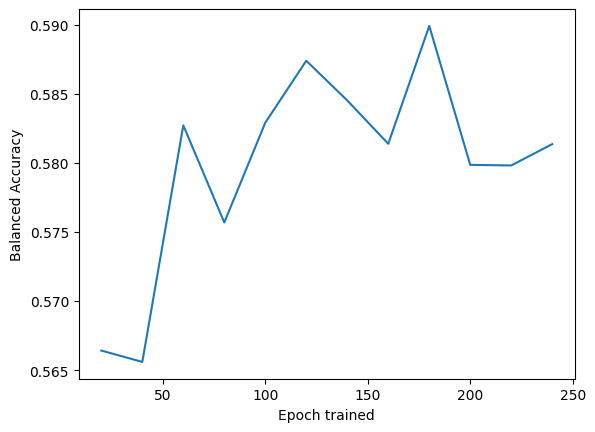

In [25]:
plt.plot(balanced_acc_1.keys(), [val[0] for val in balanced_acc_1.values()])
plt.xlabel("Epoch trained")
plt.ylabel("Balanced Accuracy")
plt.show()

#### with 0.4 ignorance threshold

In [26]:
all_diffs_2,all_actual_predictions_2 = evaluate(test_dataset_loaded, 0.4, opt)

loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_240.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_240.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_220.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_200.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_200.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
----

In [27]:
balanced_acc_2 = calculate_metrics(all_actual_predictions_2)
balanced_acc_2

{240: (0.5412280647871539, 435, 2292, 579, 1096),
 220: (0.537918771944313, 427, 2288, 583, 1104),
 200: (0.5420112519596743, 423, 2319, 552, 1108),
 180: (0.5445156308689272, 444, 2294, 577, 1087),
 160: (0.545343977853719, 470, 2250, 621, 1061),
 140: (0.5516373446394393, 517, 2198, 673, 1014),
 120: (0.5522925600517438, 567, 2108, 763, 964),
 100: (0.5591308021542937, 629, 2031, 840, 902),
 80: (0.550248196963213, 613, 2010, 861, 918),
 60: (0.5630959929254936, 703, 1915, 956, 828),
 40: (0.5528683760963767, 797, 1680, 1191, 734),
 20: (0.542414277689847, 685, 1830, 1041, 846)}

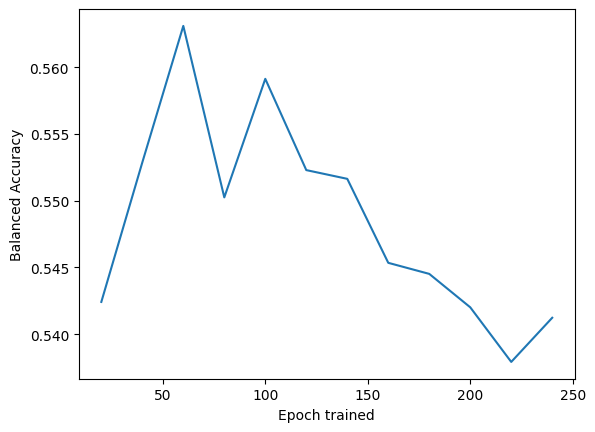

In [28]:
plt.plot(balanced_acc_2.keys(), [val[0] for val in balanced_acc_2.values()])
plt.xlabel("Epoch trained")
plt.ylabel("Balanced Accuracy")
plt.show()

#### Accuracy for train dataset

In [29]:
all_diffs_train_1,all_actual_predictions_train_1 = evaluate(dataset_loaded, 0.2, opt)


loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_240.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_240.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_220.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/cae_e_200.pth
loading the decoder from vae_v2_saved_models/aae/notrash/cae_d_200.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.299 M
[Network decoder] Total number of parameters : 12.820 M
----

In [30]:
balanced_acc_train_1 = calculate_metrics(all_actual_predictions_train_1)
balanced_acc_train_1

{240: (0.423728813559322, 0, 50, 9, 1),
 220: (0.4152542372881356, 0, 49, 10, 1),
 200: (0.4067796610169492, 0, 48, 11, 1),
 180: (0.4067796610169492, 0, 48, 11, 1),
 160: (0.4406779661016949, 0, 52, 7, 1),
 140: (0.3983050847457627, 0, 47, 12, 1),
 120: (0.4067796610169492, 0, 48, 11, 1),
 100: (0.4152542372881356, 0, 49, 10, 1),
 80: (0.3644067796610169, 0, 43, 16, 1),
 60: (0.3644067796610169, 0, 43, 16, 1),
 40: (0.3305084745762712, 0, 39, 20, 1),
 20: (0.22033898305084745, 0, 26, 33, 1)}

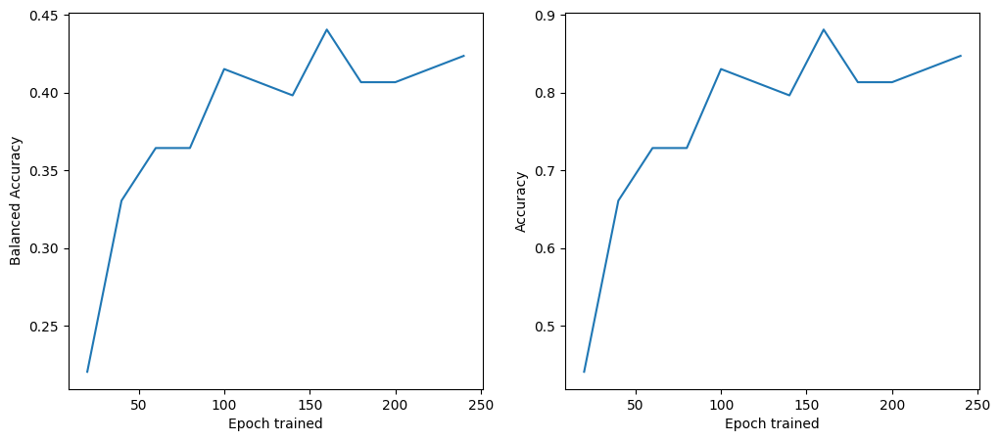

In [31]:
fig, axes = plt.subplots(1,2, figsize=(12,5))
axes[0].plot(balanced_acc_train_1.keys(),[val[0] for val in balanced_acc_train_1.values()])
axes[0].set_xlabel("Epoch trained")
axes[0].set_ylabel("Balanced Accuracy")

axes[1].plot(balanced_acc_train_1.keys(),[val[2]/(val[2]+val[3]) for val in balanced_acc_train_1.values()])
axes[1].set_xlabel("Epoch trained")
axes[1].set_ylabel("Accuracy")
plt.show()